In [1]:
# TODO: use ryan-reynolds-small.jpg to simulate forward process and backward process of diffusion model
# TODO: use ryan for testing inpainting, colorization, super-resolution
# TODO: some faces work great in each task, keep ryan as stable and show better results as well.
# TODO: colorization: presence of sun glare as exagerated in the generation and look amazing.
# TODO: What is important is the way the tasks are preformed and your knowledge of the problem
# NOTE: use https://app.diagrams.net/ for diagrams, easy prototyping maybe(?) good export support

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
os.chdir('/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/GAP/gap')
from BinomDataset_ffhq_inpaint_noaug import BinomDataset
from utils import preprocess, resize
import torch
import numpy as np
import matplotlib.pyplot as plt

In [3]:
ffhq_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/ffhq/faces/'
minpsnr = 15
maxpsnr = 16
in_dataset_ffhq = BinomDataset(ffhq_path, windowSize = 256, minPSNR = minpsnr, maxPSNR= maxpsnr, virtSize= 1, imgsize= 256, masksize = 128)

In [125]:
ffhq_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/ffhq/test/'
minpsnr = 15
maxpsnr = 16
in_dataset = BinomDataset(ffhq_path, windowSize = 256, minPSNR = minpsnr, maxPSNR= maxpsnr, virtSize= 1, imgsize= 256, masksize = 128)

In [4]:
img = in_dataset[0]
img, mask, gt, imgNoise = img[:3], img[3:4], img[4:7], img[7:]
plt.subplot(1, 4, 1)
plt.imshow(preprocess(img))
plt.subplot(1, 4, 2)
plt.imshow(preprocess(mask), 'gray')
plt.subplot(1, 4, 3)
plt.imshow(preprocess(gt))
plt.subplot(1, 4, 4)
plt.imshow(preprocess(imgNoise))

In [109]:
# import torch
# from skimage.io import imsave
# img = resize(target, out = 128, dtype = torch.float32)
# img = img - img.min()
# for i in range(250):
#     img = torch.poisson(img)
#     plt.imshow(preprocess(img))
#     imsave(f'/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/outputs/demo-prep/poisson/{i}-out.png', preprocess(img))

In [110]:
# import torch
# from skimage.io import imsave
# img = resize(target, out = 128, dtype = torch.float32)
# img = img - img.min()
# for i in range(1):
#     img = torch.rand((3, 124 ,124))
#     plt.imshow(preprocess(img))
#     imsave(f'/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/outputs/demo-prep/gaussian/{100}-out.png', preprocess(img))

In [128]:
from BinomDataset_ffhq_color_noaug import BinomDataset
ffhq_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/ffhq/faces/'
minpsnr = -30
maxpsnr = -20
c_dataset_ffhq = BinomDataset(ffhq_path, windowSize = 256, minPSNR = minpsnr, maxPSNR= maxpsnr, virtSize= 1, scale = 1, imgsize= 256)

In [3]:
from BinomDataset_ffhq_color_noaug import BinomDataset
ffhq_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/ffhq/test/'
minpsnr = -30
maxpsnr = -20
c_dataset = BinomDataset(ffhq_path, windowSize = 256, minPSNR = minpsnr, maxPSNR= maxpsnr, virtSize= 1, scale = 1, imgsize= 256)

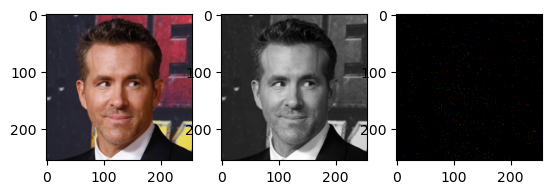

In [130]:
img = c_dataset[0]
img, gt, imgNoise = img[:3], img[3:4], img[4:]
plt.subplot(1, 3, 1)
plt.imshow(preprocess(img))
plt.subplot(1, 3, 2)
plt.imshow(preprocess(gt), 'gray')
plt.subplot(1, 3, 3)
plt.imshow(preprocess(imgNoise))
# imsave(f'/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/outputs/demo-prep/color/img.png', preprocess(img))
# imsave(f'/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/outputs/demo-prep/color/gt.png', preprocess(gt))
# imsave(f'/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/outputs/demo-prep/color/imgNoise.png', preprocess(imgNoise))

In [132]:
from BinomDataset_ffhq_super_res import BinomDataset
ffhq_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/ffhq/faces/'
minpsnr = -15
maxpsnr = -10
sr_dataset_ffhq = BinomDataset(ffhq_path, windowSize = 256, minPSNR = minpsnr, maxPSNR= maxpsnr, virtSize= 1, scale = 100, in_size= 64, out_size= 512)

In [133]:
from BinomDataset_ffhq_super_res import BinomDataset
ffhq_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/ffhq/test/'
minpsnr = -15
maxpsnr = -10
sr_dataset = BinomDataset(ffhq_path, windowSize = 256, minPSNR = minpsnr, maxPSNR= maxpsnr, virtSize= 1, scale = 100, in_size= 64, out_size= 512)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


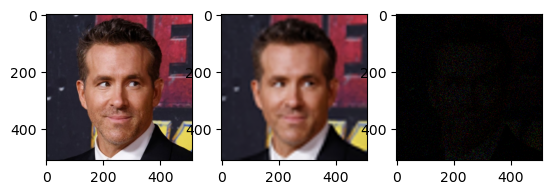

In [134]:
img = sr_dataset[0]
img, sr, imgNoise = img[:3], img[3:6], img[6:]
plt.subplot(1, 3, 1)
plt.imshow(preprocess(img))
plt.subplot(1, 3, 2)
plt.imshow(preprocess(sr))
plt.subplot(1, 3, 3)
plt.imshow(preprocess(imgNoise))
# imsave(f'/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/outputs/demo-prep/sr/img.png', preprocess(img))
# imsave(f'/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/outputs/demo-prep/sr/sr.png', preprocess(sr))
# imsave(f'/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/outputs/demo-prep/sr/imgNoise.png', preprocess(imgNoise))

In [139]:
from GAP_UNET_ResBlock_ffhq import UN
if not torch.cuda.is_available():
    raise ValueError("GPU not found, code will run on CPU and can be extremely slow!")
else:
    device = torch.device("cuda:0")

name = 'm40tom32.5-256x256-ffhq-inpainting-cascade'
CHECKPOINT_PATH = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/checkpoints/models/inpainting-cascade/256x256'

model1 = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

name = 'm32.5tom25-256x256-ffhq-inpainting-cascade'

model2 = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

name = 'm25tom17.5-256x256-ffhq-inpainting-cascade'

model3 = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

name = 'm17.5tom10-256x256-ffhq-inpainting-cascade'

model4 = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

name = 'm10tom2.5-256x256-ffhq-inpainting-cascade'

model5 = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

name = 'm2.5to5-256x256-ffhq-inpainting-cascade'

model6 = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

name = '5to12.5-256x256-ffhq-inpainting-cascade'

model7 = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

In [229]:
ffhq_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/ffhq/test/'
minpsnr = -9
maxpsnr = -7
in_dataset = BinomDataset(ffhq_path, windowSize = 256, minPSNR = minpsnr, maxPSNR= maxpsnr, virtSize= 1, imgsize= 256, masksize = 140)

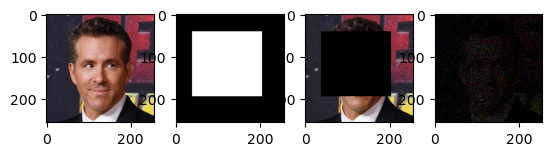

In [230]:
img = in_dataset[0]
img, mask, cond, imgNoise = img[:3], img[3:4], img[4:7], img[7:]
plt.subplot(1, 4, 1)
plt.imshow(preprocess(img))
plt.subplot(1, 4, 2)
plt.imshow(preprocess(mask), 'gray')
plt.subplot(1, 4, 3)
plt.imshow(preprocess(cond))
plt.subplot(1, 4, 4)
plt.imshow(preprocess(imgNoise))

cond_input shape torch.Size([1, 4, 256, 256])
cond_img shape torch.Size([1, 4, 256, 256])
input_img shape torch.Size([1, 7, 256, 256])
input_img shape torch.float32
(1, 3, 256, 256)


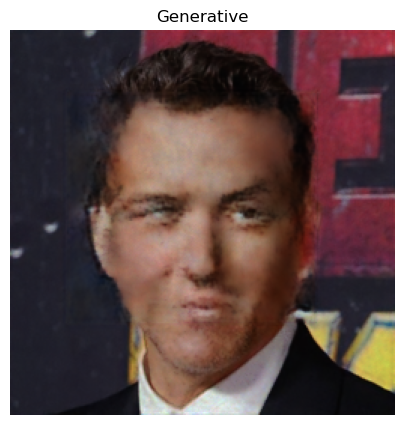

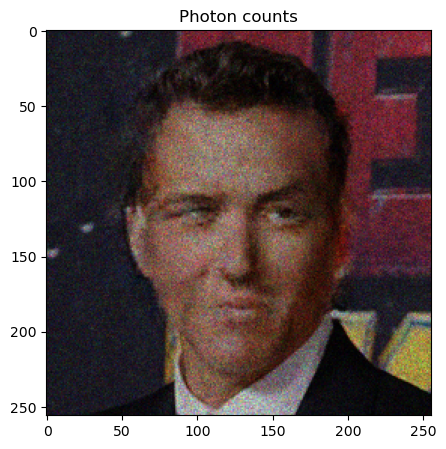

_______________________________________ 346
time (s): 34.47750997543335 time per image (s) 34.47750997543335


In [236]:
from inference_ffhq_cascade import sample_image
import matplotlib.image as mpimg
import time
import numpy as np


channels = 3
# we can sample multiple images at the same time in a batch
batch_size = 1
# for best results this should correspond to training pach size
pixels_x = 256
pixels_y = 256

inp_img =  torch.zeros(batch_size ,channels, pixels_y, pixels_x)
inp_img = imgNoise[None]

cond_input = torch.from_numpy(np.expand_dims(np.concatenate((mask, cond), axis = 0), axis = 0))
# cond_input = torch.from_numpy(np.expand_dims(np.concatenate((np.ones_like(mask), np.zeros_like(cond_test)), axis = 0), axis = 0))

print(f'cond_input shape {cond_input.shape}')

cond_img = cond_input
print(f'cond_img shape {cond_img.shape}')

# cond_img = torch.zeros_like(cond_img)
input_img = torch.cat((cond_img, inp_img), 1).to(device)
print(f'input_img shape {input_img.shape}')
print(f'input_img shape {input_img.dtype}')


for i in range(1):
    

    startTime = time.time()
    
    # sampling the image(s)
    denoised, photons, stack, iterations = sample_image(input_img,
                                                        [model1, model2, model3, model4, model5, model6, model7], 
                                                        beta = 0.005,
                                                        save_every_n = 10,
                                                        max_psnr = -33,
                                                        max_its = 50000000,
                                                        channels = 3)

    
    # In case we do multiple images in a batch, we show all of them.
    for j in range(denoised.shape[0]):

            denoised/=denoised.mean()
            print(denoised.shape)
            plt.figure(figsize = (5,5))
            plt.imshow(preprocess(denoised[0]), vmin = 0,
                       vmax = np.percentile(preprocess(denoised[0]),99.99))
            plt.title('Generative')
            plt.axis('off')
            plt.show()
            
            plt.figure(figsize = (5,5))
            plt.imshow(preprocess(photons[0]), vmin = 0,
                       vmax = np.percentile(preprocess(photons[0]),99.99))
            plt.title('Photon counts')
            plt.show()
            
            
    
    print('_______________________________________', iterations)
    
    
    
    
    endTime = time.time()
    elapsedTime = endTime - startTime
    print ('time (s):', elapsedTime, 'time per image (s)', elapsedTime/denoised.shape[0])
   

In [238]:
len(stack)

97

0
psnr : -8.277574978971689


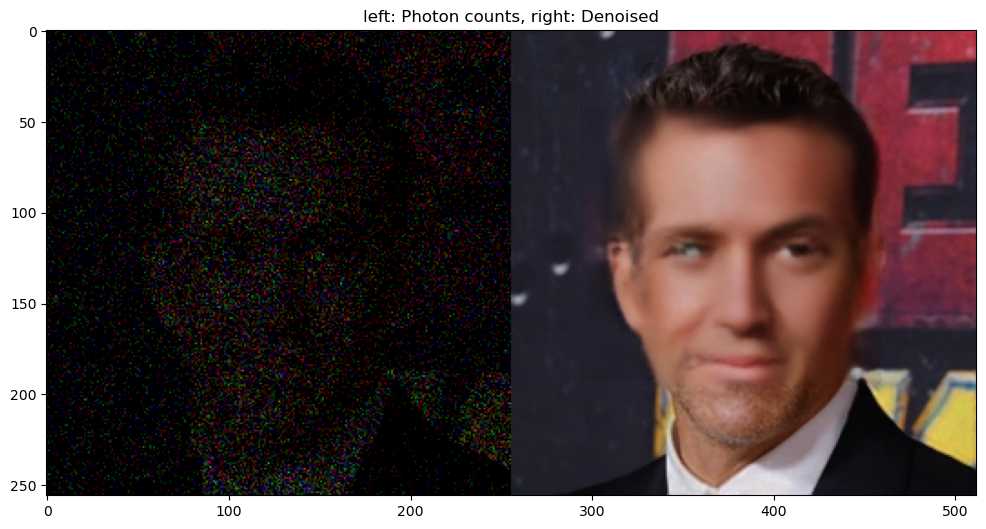

30
psnr : -1.838708137627552


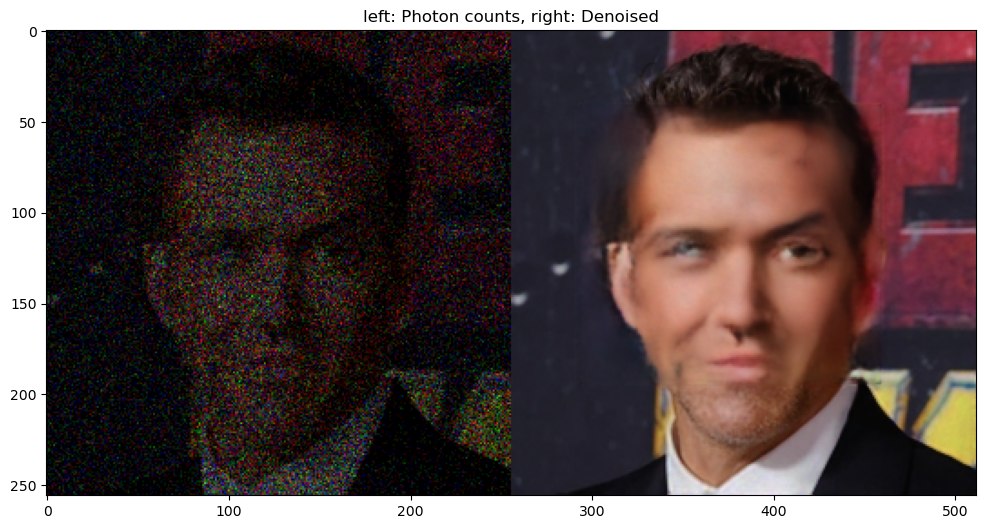

60
psnr : 4.669230739226558


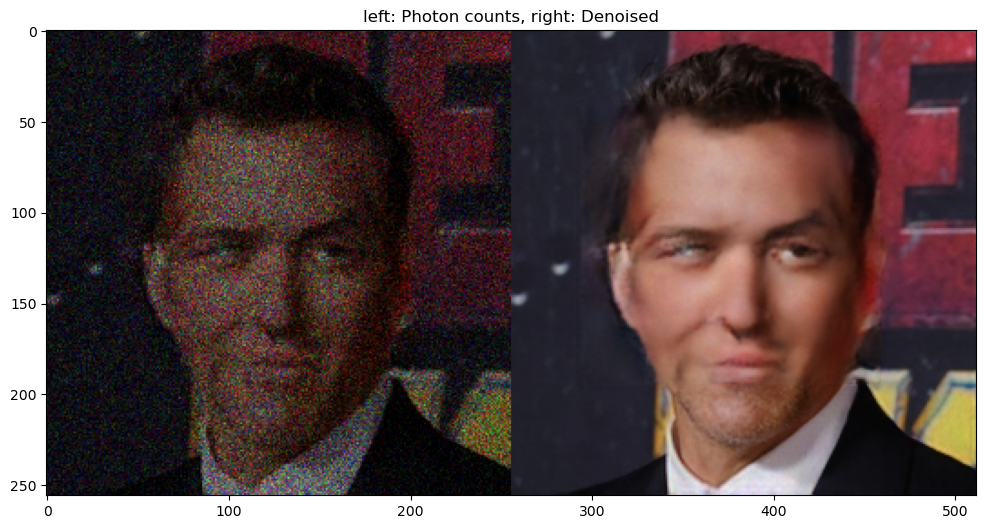

90
psnr : 11.081366750950227


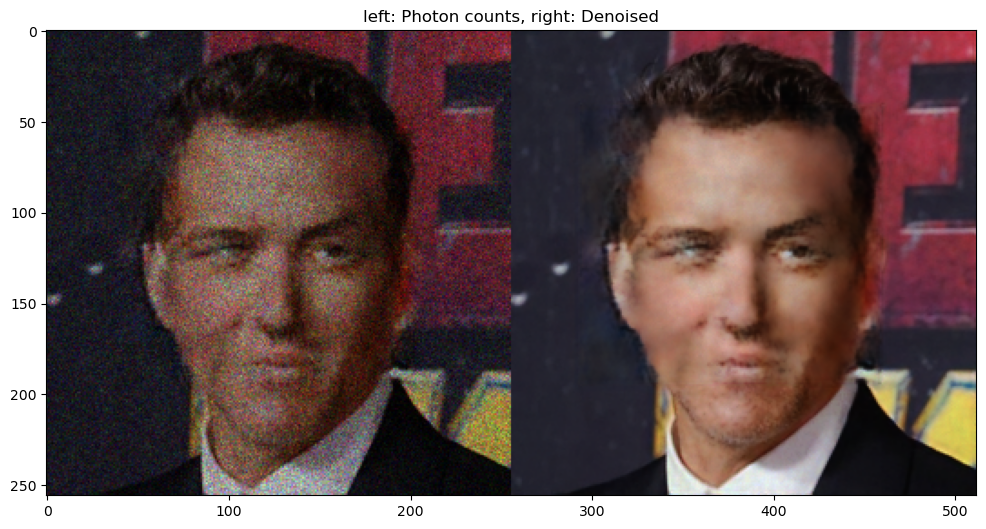

In [240]:
for i in range(len(stack)):
    if i%30 == 0 :
        im = (stack[i][0].transpose(1, 2, 0) * 255).astype(np.uint8)
        print(i)
        print(f'psnr : {stack[i][1]}')
        plt.figure(figsize = (12,12))
        plt.imshow(im, vmax = 0.9)
        plt.title('left: Photon counts, right: Denoised')
        plt.show()

In [3]:
from GAP_UNET_ResBlock_ffhq_color import UN
if not torch.cuda.is_available():
    raise ValueError("GPU not found, code will run on CPU and can be extremely slow!")
else:
    device = torch.device("cuda:0")


name = 'm40tom30-256x256-ffhq-colorization-noaug'
CHECKPOINT_PATH = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/checkpoints/models/colorization-cascade/'

cmodel1 = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

name = 'm30tom20-256x256-ffhq-colorization-noaug'

cmodel2 = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

name = 'm20tom10-256x256-ffhq-colorization-noaug'

cmodel3 = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

name = 'm10to0-256x256-ffhq-colorization-noaug'

cmodel4 = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)


/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/GAP/gap/GAP_UNET_ResBlock_ffhq_color.py:255: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
  init.xavier_normal(m.weight)
/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/GAP/gap/GAP_UNET_ResBlock_ffhq_color.py:256: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.bias, 0)


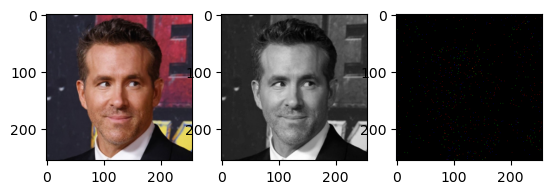

In [4]:
from BinomDataset_ffhq_color_noaug import BinomDataset
ffhq_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/ffhq/test/'
minpsnr = -30
maxpsnr = -20
c_dataset = BinomDataset(ffhq_path, windowSize = 256, minPSNR = minpsnr, maxPSNR= maxpsnr, virtSize= 1, scale = 1, imgsize= 256)
img = c_dataset[0]
img, cond, imgNoise = img[:3], img[3:4], img[4:]
plt.subplot(1, 3, 1)
plt.imshow(preprocess(img))
plt.subplot(1, 3, 2)
plt.imshow(preprocess(cond), 'gray')
plt.subplot(1, 3, 3)
plt.imshow(preprocess(imgNoise))

In [6]:
cond.shape

torch.Size([1, 256, 256])

In [11]:
input_img[:,-3:, :, :]

torch.Size([1, 3, 256, 256])

cond_input shape torch.Size([1, 1, 256, 256])
cond_img shape torch.Size([1, 1, 256, 256])
input_img shape torch.Size([1, 4, 256, 256])
input_img shape torch.float32
(1, 3, 256, 256)


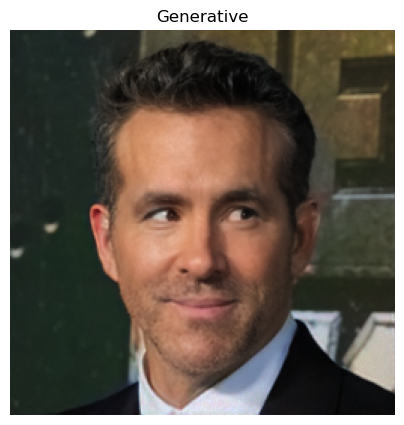

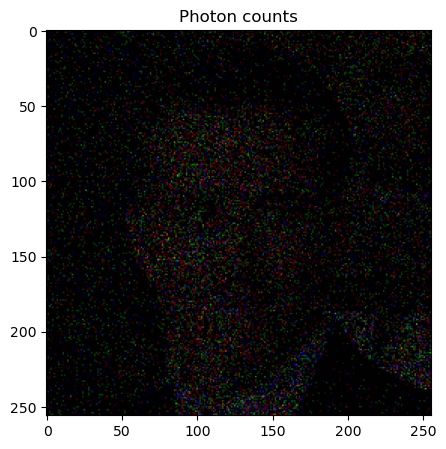

_______________________________________ 340
time (s): 34.48741865158081 time per image (s) 34.48741865158081


In [13]:
from inference_ffhq_cascade import sample_image
import matplotlib.image as mpimg
import time
import numpy as np


channels = 3
# we can sample multiple images at the same time in a batch
batch_size = 1
# for best results this should correspond to training pach size
pixels_x = 256
pixels_y = 256

inp_img =  torch.zeros(batch_size ,channels, pixels_y, pixels_x)

cond_input = torch.from_numpy(np.expand_dims(cond, axis = 0))
print(f'cond_input shape {cond_input.shape}')

cond_img = cond_input
print(f'cond_img shape {cond_img.shape}')

# cond_img = torch.zeros_like(cond_img)
input_img = torch.cat((cond_img, inp_img), 1).to(device)
print(f'input_img shape {input_img.shape}')
print(f'input_img shape {input_img.dtype}')

for i in range(1):
    

    startTime = time.time()
    
    # sampling the image(s)
    denoised, photons, stack, iterations = sample_image(input_img,
                                                        [cmodel1, cmodel2, cmodel3, cmodel4], 
                                                        beta = 0.005,
                                                        save_every_n = 10,
                                                        max_psnr = -33,
                                                        max_its = 50000000,
                                                        channels = 3,
                                                        grayscale = False)

    
    # In case we do multiple images in a batch, we show all of them.
    for j in range(denoised.shape[0]):

            denoised/=denoised.mean()
            print(denoised.shape)
            plt.figure(figsize = (5,5))
            plt.imshow(preprocess(denoised[0]), vmin = 0,
                       vmax = np.percentile(preprocess(denoised[0]),99.99))
            plt.title('Generative')
            plt.axis('off')
            plt.show()
            
            plt.figure(figsize = (5,5))
            plt.imshow(preprocess(photons[0]), vmin = 0,
                       vmax = np.percentile(preprocess(photons[0]),99.99))
            plt.title('Photon counts')
            plt.show()
            
            
    
    print('_______________________________________', iterations)
    
    
    
    
    endTime = time.time()
    elapsedTime = endTime - startTime
    print ('time (s):', elapsedTime, 'time per image (s)', elapsedTime/denoised.shape[0])
   

In [18]:
from GAP_UNET_ResBlock_ffhq_super_res import UN

name = 'm40to30-256x256-ffhq-super-res'
CHECKPOINT_PATH = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/checkpoints/models/'

srmodel = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/GAP/gap/GAP_UNET_ResBlock_ffhq_super_res.py:255: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
  init.xavier_normal(m.weight)
/mnt/c/Users/ankit/Desktop/Msc AIML/msc-project/GAP/gap/GAP_UNET_ResBlock_ffhq_super_res.py:256: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.bias, 0)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


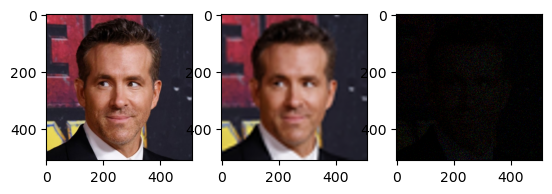

In [14]:
from BinomDataset_ffhq_super_res import BinomDataset
ffhq_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/ffhq/test/'
minpsnr = -15
maxpsnr = -10
sr_dataset = BinomDataset(ffhq_path, windowSize = 256, minPSNR = minpsnr, maxPSNR= maxpsnr, virtSize= 1, scale = 100, in_size= 64, out_size= 512)
img = sr_dataset[0]
img, cond, imgNoise = img[:3], img[3:6], img[6:]
plt.subplot(1, 3, 1)
plt.imshow(preprocess(img))
plt.subplot(1, 3, 2)
plt.imshow(preprocess(cond))
plt.subplot(1, 3, 3)
plt.imshow(preprocess(imgNoise))

In [15]:
cond.shape

torch.Size([3, 512, 512])

cond_input shape torch.Size([1, 3, 512, 512])
cond_img shape torch.Size([1, 3, 512, 512])
input_img shape torch.Size([1, 6, 512, 512])
input_img shape torch.float32
(1, 3, 512, 512)


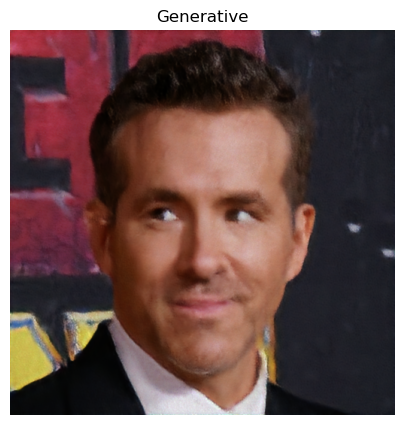

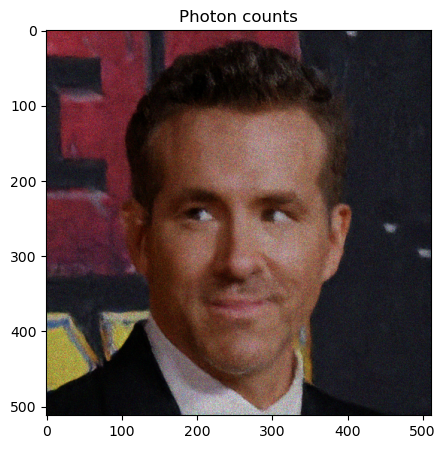

_______________________________________ 315
time (s): 15.412655115127563 time per image (s) 15.412655115127563


In [28]:
from inference_ffhq import sample_image

channels = 3
# we can sample multiple images at the same time in a batch
batch_size = 1
# for best results this should correspond to training pach size
pixels_x = 512
pixels_y = 512

inp_img =  torch.zeros(batch_size ,channels, pixels_y, pixels_x)

cond_input = cond[None]
print(f'cond_input shape {cond_input.shape}')
# inp_img = dataTest[None]
cond_img = cond_input
print(f'cond_img shape {cond_img.shape}')

# cond_img = torch.zeros_like(cond_img)
input_img = torch.cat((cond_img, inp_img), 1).to(device)
print(f'input_img shape {input_img.shape}')
print(f'input_img shape {input_img.dtype}')


for i in range(1):

    startTime = time.time()
    
    # sampling the image(s)
    denoised, photons, stack, iterations = sample_image(input_img,
                                                        srmodel, 
                                                        beta = 0.05,
                                                        save_every_n = 10,
                                                        max_psnr = 15,
                                                        max_its = 20000000,
                                                        channels = 3)

    
    # In case we do multiple images in a batch, we show all of them.
    for j in range(denoised.shape[0]):

            denoised/=denoised.mean()
            print(denoised.shape)
            plt.figure(figsize = (5,5))
            plt.imshow(preprocess(denoised[0]), vmin = 0,
                       vmax = np.percentile(denoised[0],99.99))
            plt.title('Generative')
            plt.axis('off')
            plt.show()
            
            plt.figure(figsize = (5,5))
            plt.imshow(preprocess(photons[0]), vmin = 0,
                       vmax = np.percentile(photons[j],99.99))
            plt.title('Photon counts')
            plt.show()
            
            
    
    print('_______________________________________', iterations)
    
    
    
    
    endTime = time.time()
    elapsedTime = endTime - startTime
    print ('time (s):', elapsedTime, 'time per image (s)', elapsedTime/denoised.shape[0])
   

In [29]:
len(stack)

32

0
psnr : -40


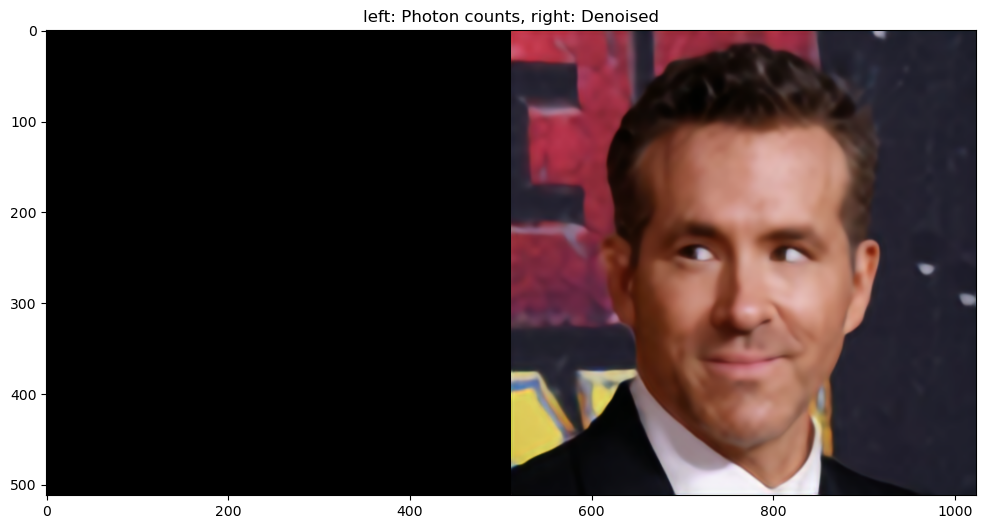

2
psnr : -40


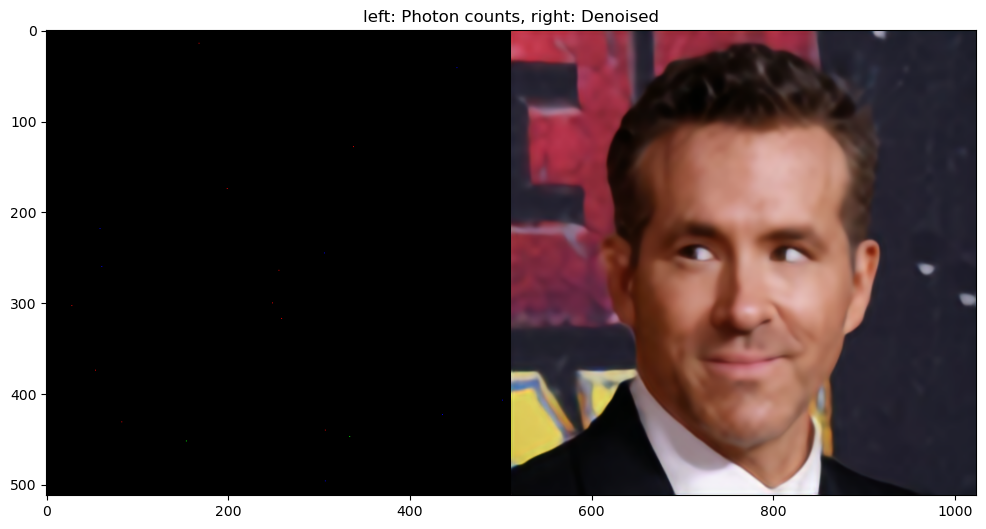

4
psnr : -40


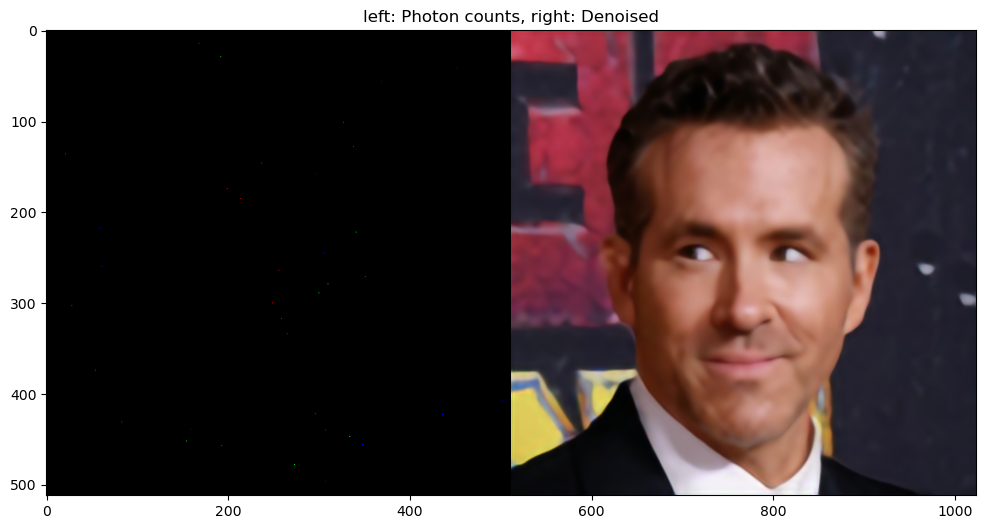

6
psnr : -38.662773835029185


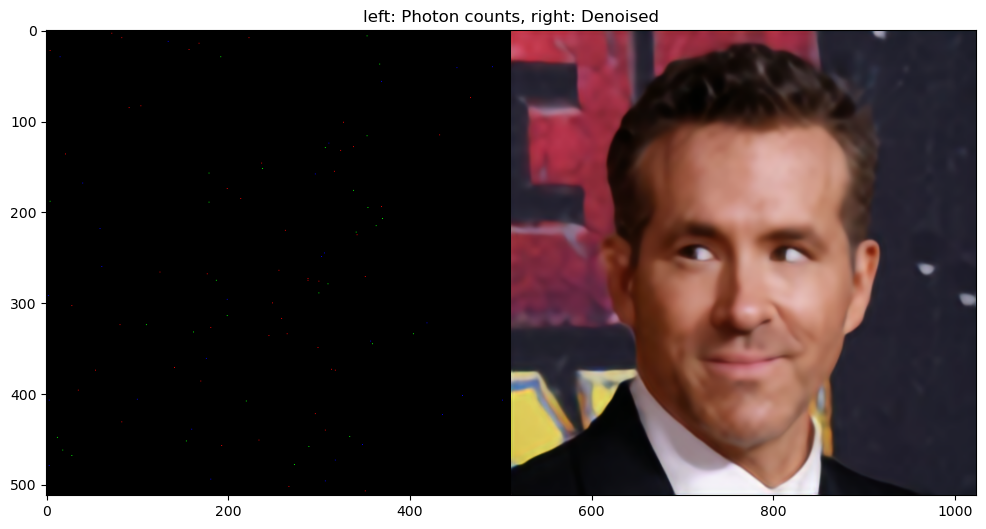

8
psnr : -34.500569733977265


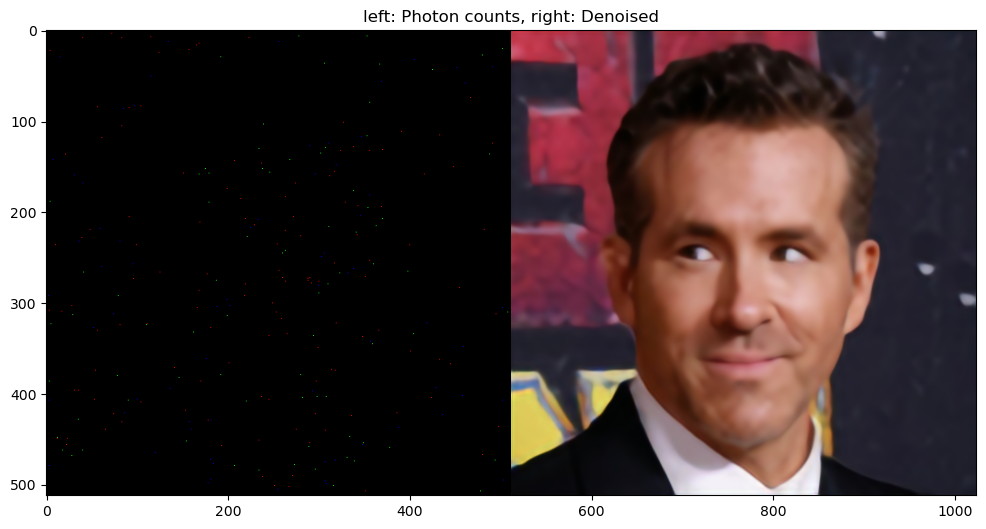

10
psnr : -30.252572535302814


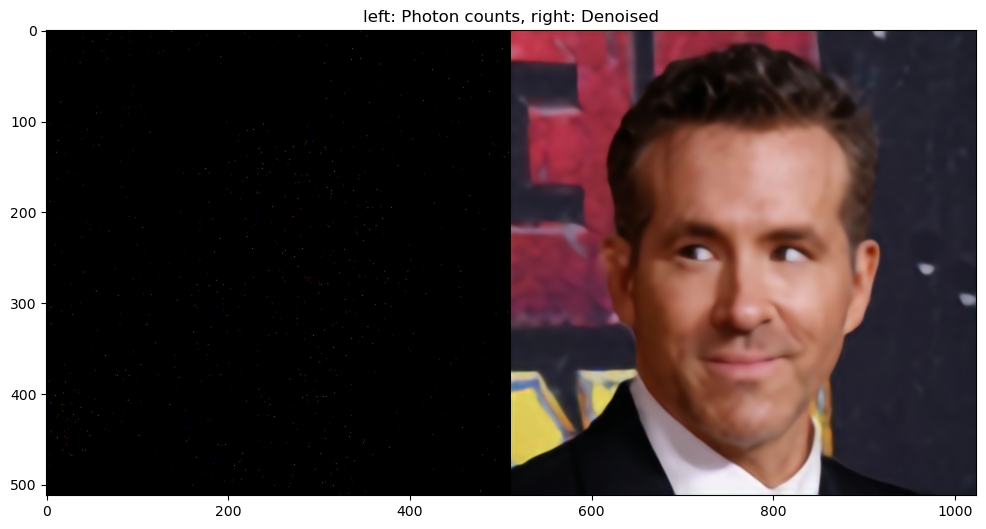

12
psnr : -26.087557963154463


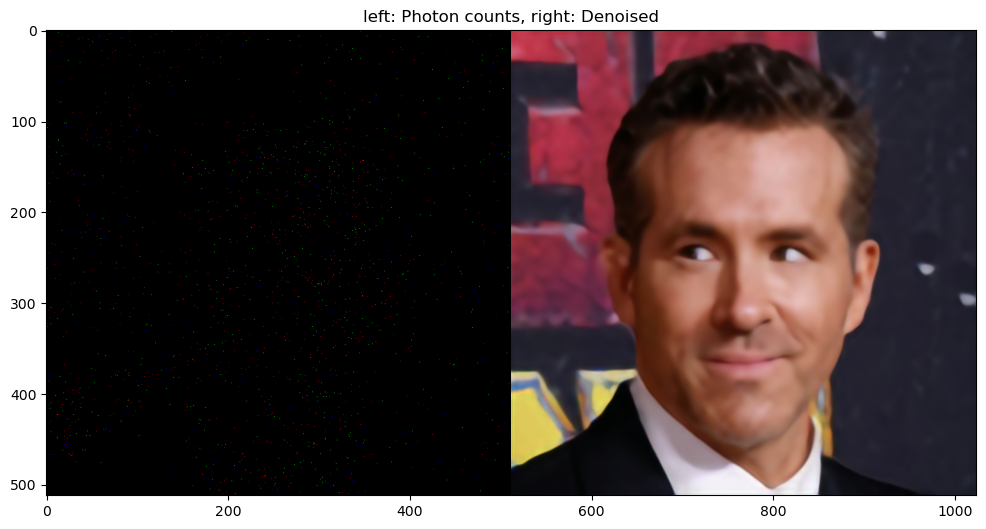

14
psnr : -21.94870934179884


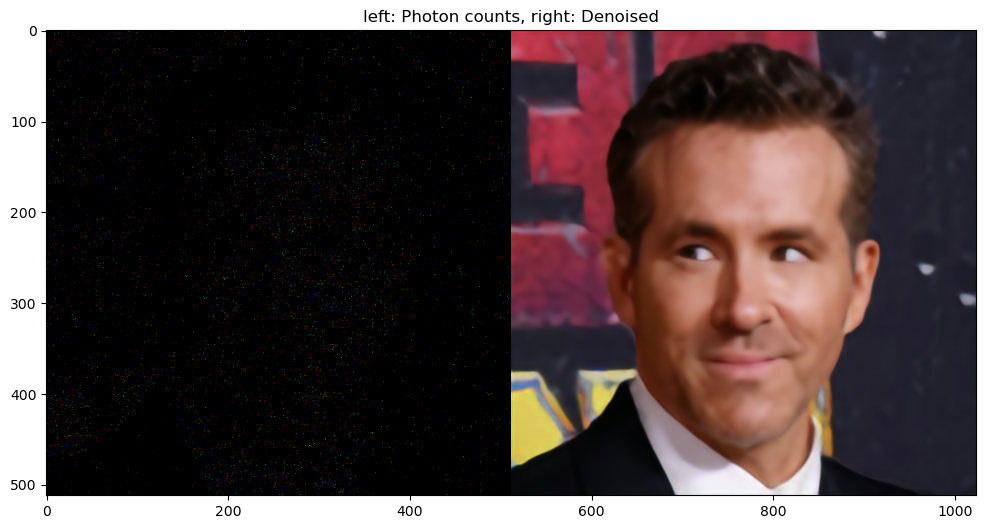

16
psnr : -17.70017252556861


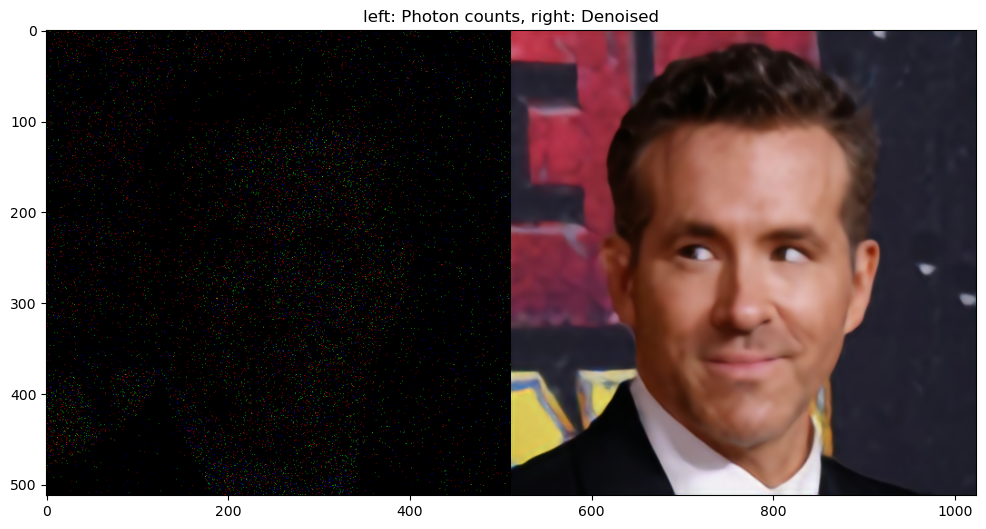

18
psnr : -13.489334598557559


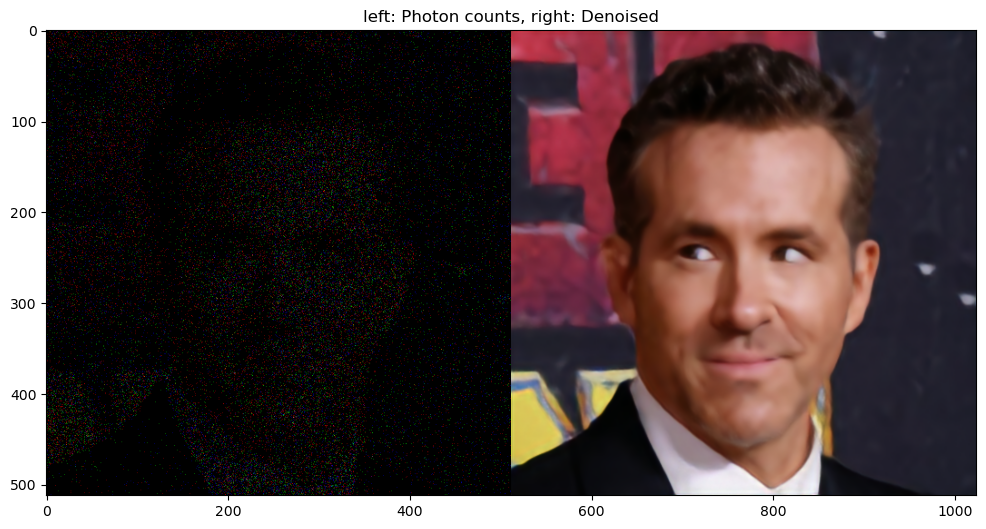

20
psnr : -9.251376426891687


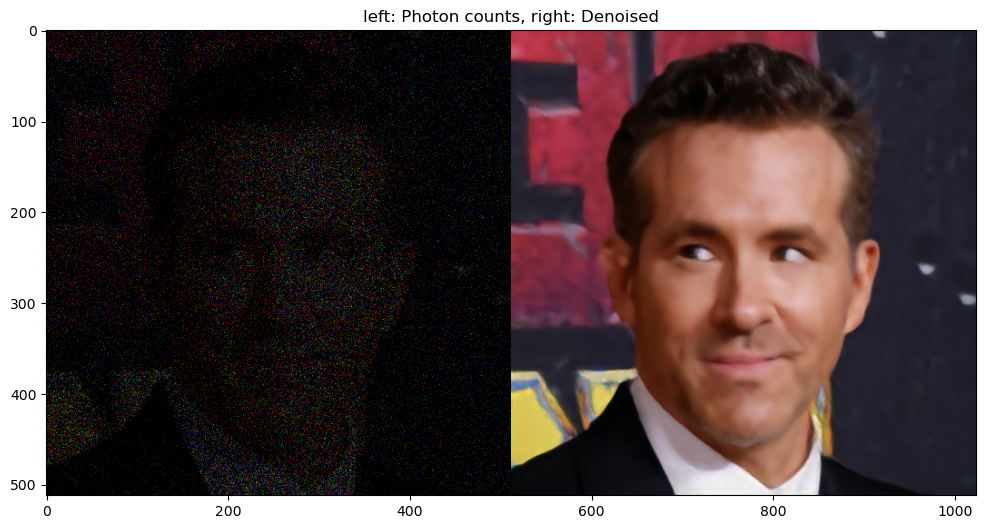

22
psnr : -5.029325618386804


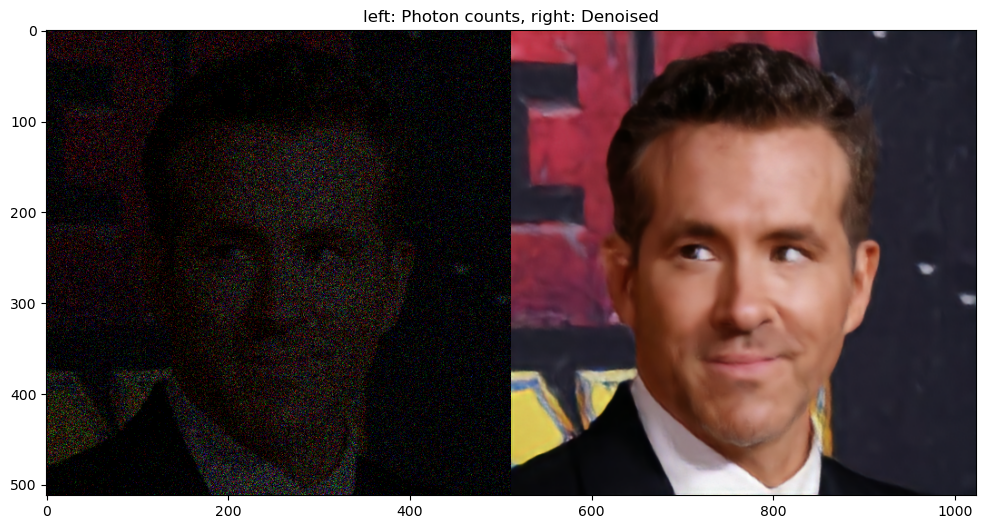

24
psnr : -0.7817247230745257


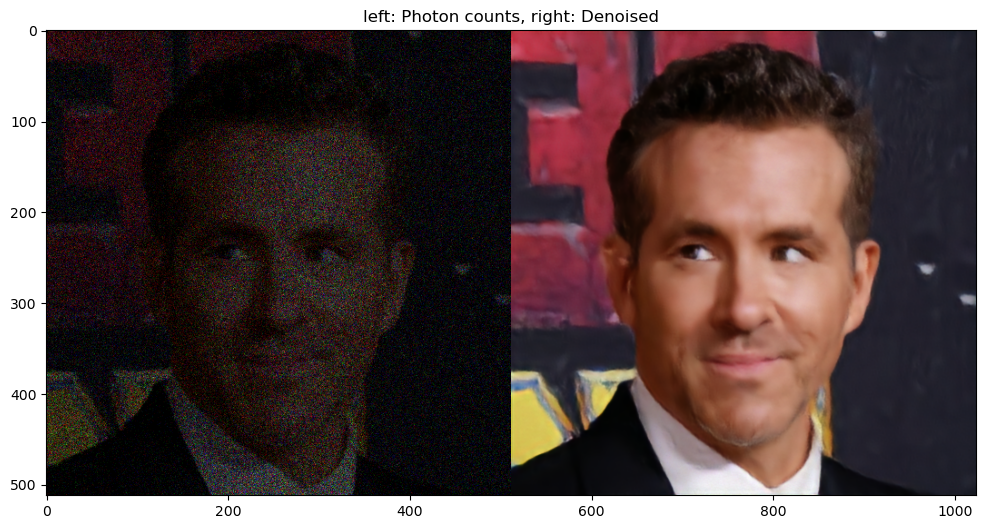

26
psnr : 3.454348540726694


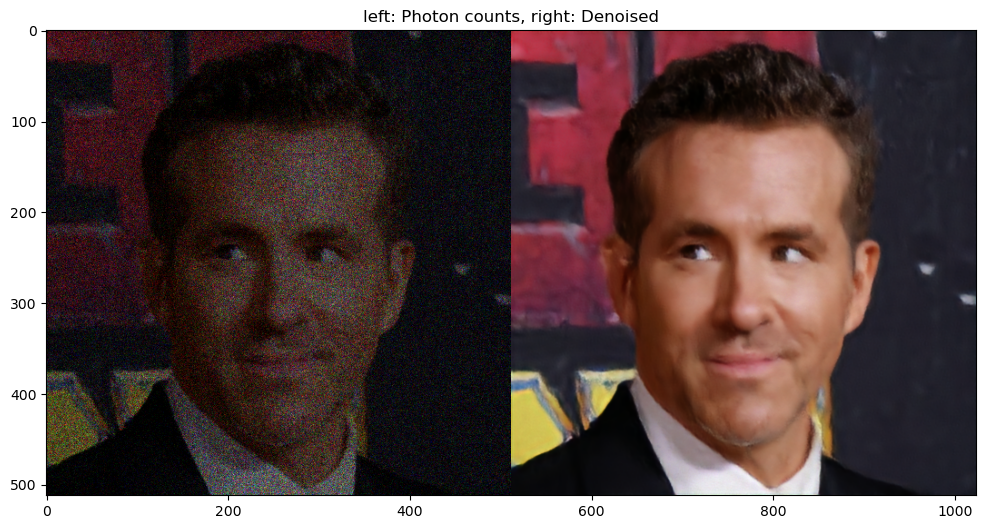

28
psnr : 7.689717744901187


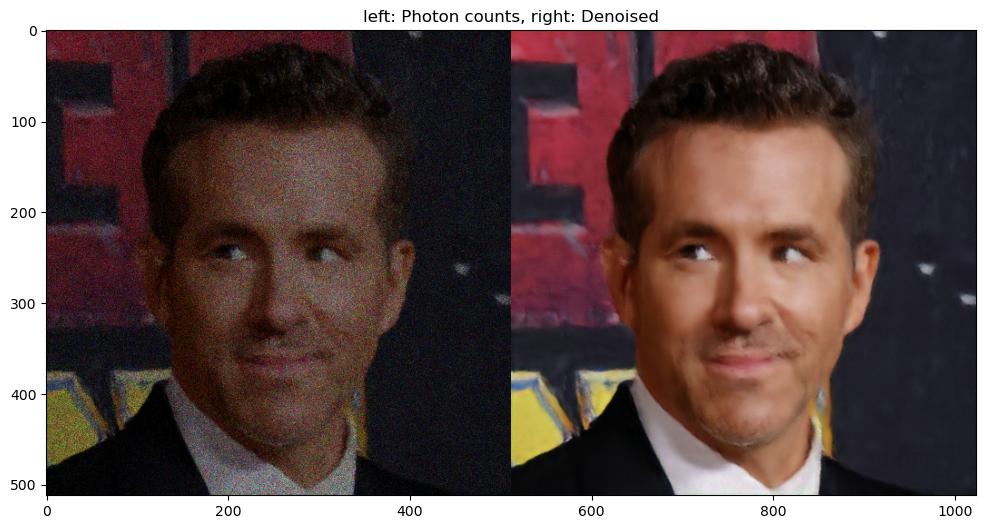

30
psnr : 11.926684047212783


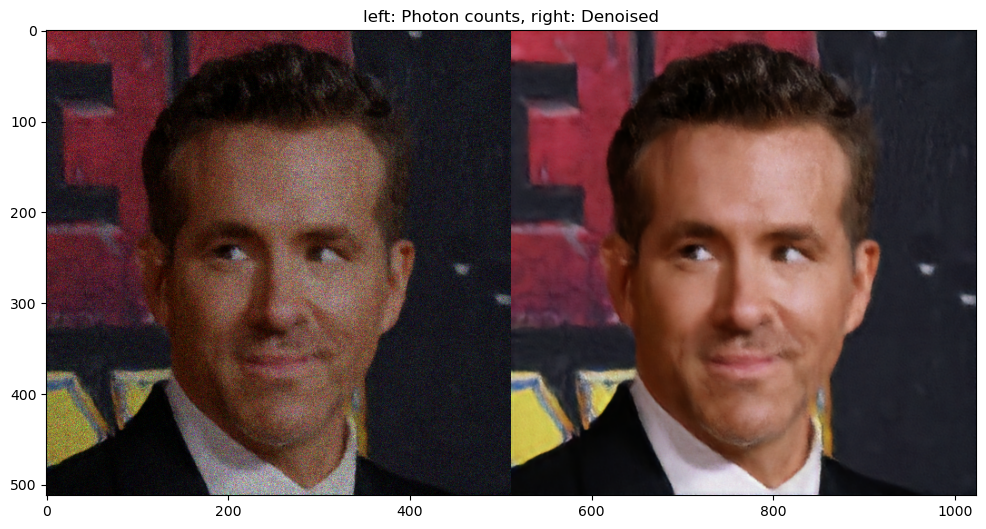

In [30]:
for i in range(len(stack)):
    if i%2 == 0 :
        im = (stack[i][0].transpose(1, 2, 0) * 255).astype(np.uint8)
        print(i)
        print(f'psnr : {stack[i][1]}')
        plt.figure(figsize = (12,12))
        plt.imshow(im, vmax = 0.9)
        plt.title('left: Photon counts, right: Denoised')
        plt.show()